# Interpretability

- https://shap.readthedocs.io/en/latest/

In [1]:
#!pip install shap

In [2]:
import numpy as np
import pandas as pd

from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from sklearn.impute import SimpleImputer
from tpot.export_utils import set_param_recursive

import shap
import matplotlib as plt

shap.initjs()
pd.options.display.max_columns = None

C:\SIM\anaconda3\envs\autopro\lib\site-packages\tpot\builtins\__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


In [3]:
X1 = pd.read_csv('X1.csv')
X2 = pd.read_csv('X2.csv')
target = pd.read_csv('target.csv')

df_legend = pd.read_excel('df_project2.xlsx', sheet_name = 'data_dictionary') # load the data dictionary

## Model X1

In [4]:
existing_columns_x1 = X1.columns

numeric_cols_x1 = list(set(df_legend[df_legend['isnumeric']==1]['name_col']).intersection(existing_columns_x1))
yes_no_cols_x1 = list(set(df_legend[df_legend['no_yes_vars']==1]['name_col']).intersection(existing_columns_x1))
other_cols_x1 = list(set(df_legend[(df_legend['no_yes_vars']==0) & (df_legend['isnumeric']==0)]['name_col']).intersection(existing_columns_x1))

# add dummy columns that are missing from previous lists
#missing_cols_x1 = set(existing_columns_x1).difference(numeric_cols).difference(yes_no_cols).difference(other_cols)

In [5]:
# model X1

# NOTE: Make sure that the outcome column is labeled 'target' in the data file
tpot_data_x1 = pd.read_csv('X1.csv', dtype=np.float64)
target = pd.read_csv('target.csv')

#features = tpot_data.drop('target', axis=1)
training_features_x1, testing_features_x1, training_target_x1, testing_target_x1 = \
            train_test_split(tpot_data_x1, target, random_state=42)

imputer = SimpleImputer(strategy="median")
imputer.fit(training_features_x1)
training_features_x1 = imputer.transform(training_features_x1)
testing_features_x1 = imputer.transform(testing_features_x1)

# Average CV score on the training set was: 0.9144442303468017
exported_pipeline_x1 = make_pipeline(
    
    StackingEstimator(estimator=SGDClassifier(alpha=0.0, eta0=1.0, fit_intercept=True, l1_ratio=0.5, 
        learning_rate="invscaling", loss="hinge", penalty="elasticnet", power_t=0.0)),
    StackingEstimator(estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=3, max_features=0.9500000000000001, 
        min_samples_leaf=16, min_samples_split=10, n_estimators=100, subsample=0.45)),
    RandomForestClassifier(bootstrap=True, criterion="gini", max_features=1.0, min_samples_leaf=10, min_samples_split=20, 
        n_estimators=100)
)

# Fix random state for all the steps in exported pipeline
set_param_recursive(exported_pipeline_x1.steps, 'random_state', 42)

#Changed training_target_x1 to training_target_x1.values.ravel()
exported_pipeline_x1.fit(training_features_x1, training_target_x1.values.ravel())
results_x1 = exported_pipeline_x1.predict(testing_features_x1)

In [6]:
exported_pipeline_x1

Pipeline(steps=[('stackingestimator-1',
                 StackingEstimator(estimator=SGDClassifier(alpha=0.0, eta0=1.0,
                                                           l1_ratio=0.5,
                                                           learning_rate='invscaling',
                                                           penalty='elasticnet',
                                                           power_t=0.0,
                                                           random_state=42))),
                ('stackingestimator-2',
                 StackingEstimator(estimator=GradientBoostingClassifier(learning_rate=0.01,
                                                                        max_features=0.9500000000000001,
                                                                        min_samples_leaf=16,
                                                                        min_samples_split=10,
                                                                        random_state=42,
                                                                        subsample=0.45))),
                ('randomforestclassifier',
                 RandomForestClassifier(max_features=1.0, min_samples_leaf=10,
                                        min_samples_split=20,
                                        random_state=42))])

In [7]:
exported_pipeline_x1['randomforestclassifier']

RandomForestClassifier(max_features=1.0, min_samples_leaf=10,
                       min_samples_split=20, random_state=42)

In [8]:
explainer_x1 = shap.TreeExplainer(exported_pipeline_x1['randomforestclassifier'])
#Additivity check failes in TreeExplainer.
#Sum of the SHAP values was 0.504963, while the model output was 0.501399
#need to sort this out
shap_values_x1 = explainer_x1.shap_values(testing_features_x1, check_additivity=False)

#now you hava a set of classifires
#shap_values_x1[0] == Mace 0
#shap_values_x1[1] == Mace 1
pd.DataFrame(shap_values_x1[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59
0,0.000000,-0.344339,-0.317368,0.000477,-0.003609,-0.000059,-0.008192,-0.000123,-0.011269,0.003515,0.000591,-0.000221,-0.000595,-0.004134,0.001064,-0.009244,-0.004550,-0.001067,-0.002806,-0.030075,-0.035798,0.000263,0.0,-0.000383,0.000008,-0.000375,-0.000973,-0.002631,-0.000523,0.0,-0.010213,-0.000458,0.001207,0.002427,-0.001255,-0.003872,0.0,-0.002479,0.000115,0.000856,0.001676,-0.002130,-0.000345,-0.003088,-0.005456,-0.002804,-0.006276,-0.000732,-0.008927,-0.000238,-0.001539,0.001641,-0.006074,0.002272,-0.004154,0.002029,0.000441,0.001252,0.000005,0.0
1,-0.000805,-0.361260,-0.328259,0.000481,-0.002770,-0.000033,-0.008760,-0.000029,-0.011246,0.003734,0.000598,-0.000216,-0.000741,-0.003956,0.000820,0.001049,-0.003078,-0.000868,-0.002113,-0.030630,-0.035249,0.000269,0.0,-0.000285,0.000009,-0.000438,-0.001123,-0.002529,-0.000362,0.0,-0.006946,-0.001903,0.002169,0.001831,-0.001467,-0.004270,0.0,-0.002357,0.000012,0.000663,0.002690,0.001490,-0.000293,0.000897,-0.000619,-0.002815,-0.004168,-0.001020,-0.009170,-0.000264,-0.002440,0.002142,-0.005614,0.002962,-0.003500,0.002040,0.000264,0.001246,0.000005,0.0
2,0.000304,0.037983,-0.316747,-0.000306,-0.004710,-0.000024,-0.007520,0.000179,-0.005115,0.001157,0.000017,-0.000256,-0.000601,-0.004886,0.000715,-0.011274,-0.004072,-0.000464,-0.001323,-0.012834,-0.019215,-0.000897,0.0,-0.000053,-0.000171,-0.000458,-0.001032,-0.005432,-0.000696,0.0,-0.009468,-0.001468,0.000924,-0.007824,-0.001096,-0.003439,0.0,0.000156,-0.001367,-0.001921,-0.002263,-0.003028,-0.000198,-0.007620,-0.012827,-0.002795,-0.006004,-0.000942,-0.014967,0.000066,-0.006404,0.000908,-0.005579,0.001159,-0.010000,0.002100,0.000254,-0.000781,0.000005,0.0
3,-0.002400,-0.341495,-0.318868,-0.000325,-0.002837,-0.000066,-0.008037,-0.000128,-0.010144,0.003479,0.000591,-0.000212,-0.000598,-0.004221,0.000958,-0.008790,-0.002901,-0.000984,-0.002302,-0.028924,-0.035967,0.000263,0.0,-0.000427,-0.000158,-0.000385,-0.000981,-0.002516,-0.000367,0.0,-0.010193,0.000482,0.001653,-0.004574,-0.001552,-0.004252,0.0,-0.002546,0.000029,0.000706,0.002607,0.000662,-0.000382,-0.000617,-0.006952,-0.002920,-0.005333,-0.000948,-0.008991,-0.000261,-0.002251,0.001582,-0.005834,0.003167,-0.005723,0.001654,0.000446,-0.000775,0.000005,0.0
4,-0.000675,-0.353530,-0.318439,-0.000325,-0.003111,-0.000469,-0.008521,0.000033,-0.009398,0.003370,0.000589,-0.000232,-0.000734,-0.004038,0.000810,-0.001383,-0.002594,-0.000797,-0.002307,-0.027283,-0.033867,-0.000098,0.0,-0.000335,0.000010,-0.000407,-0.001176,-0.002675,-0.000389,0.0,0.012966,-0.001230,0.002164,0.001608,-0.001033,-0.004367,0.0,-0.002674,-0.000072,0.000945,0.003580,-0.001069,-0.000942,-0.001386,0.002038,-0.002887,-0.002463,-0.001047,-0.008933,-0.000265,-0.003613,0.002115,-0.002049,0.002154,-0.002871,0.002508,0.000257,0.001252,0.000005,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,-0.000602,-0.357720,-0.323522,0.000477,-0.002717,-0.000362,-0.008234,-0.000115,-0.011215,0.003707,0.000584,-0.000211,-0.000603,-0.003754,0.000886,-0.005505,-0.003888,-0.001041,-0.002041,-0.030945,-0.035134,0.000270,0.0,-0.000269,0.000009,-0.000397,-0.001013,-0.002539,-0.000398,0.0,-0.010244,-0.000298,0.001883,0.001866,-0.001171,-0.004158,0.0,-0.002370,0.000030,0.000609,0.002960,0.001163,-0.000170,0.000391,0.000215,-0.002731,-0.003763,-0.000908,-0.008347,-0.000251,-0.002896,0.001683,-0.005932,0.002283,-0.002818,0.001911,0.000246,0.001246,0.000005,0.0
1077,0.000238,0.038645,-0.309277,0.000448,-0.004870,-0.000453,-0.007229,-0.000103,-0.006354,0.001173,0.000008,-0.000290,-0.000607,-0.004435,0.000723,-0.012163,-0.004198,-0.000490,-0.001294,-0.015407,-0.018577,0.001070,

In [9]:
#explainer = shap.TreeExplainer(exported_pipeline_x1.named_steps["randomforestclassifier"])
#shap_values = explainer.shap_values(exported_pipeline_x1[:-1].transform(training_features_x1))
#shap_values

#https://github.com/slundberg/shap/issues/1373
#https://stackoverflow.com/questions/55867862/how-to-use-shap-with-a-linear-svc-model-from-sklearn-using-pipeline
#https://datascience.stackexchange.com/questions/52476/how-to-use-shap-kernal-explainer-with-pipeline-models
#https://stackoverflow.com/questions/67394585/shap-or-lime-with-tpot-classifier

In [10]:
# add labels
df_testing_x1 = pd.DataFrame(testing_features_x1, columns = X1.columns)

### Global

#### Feature Importances

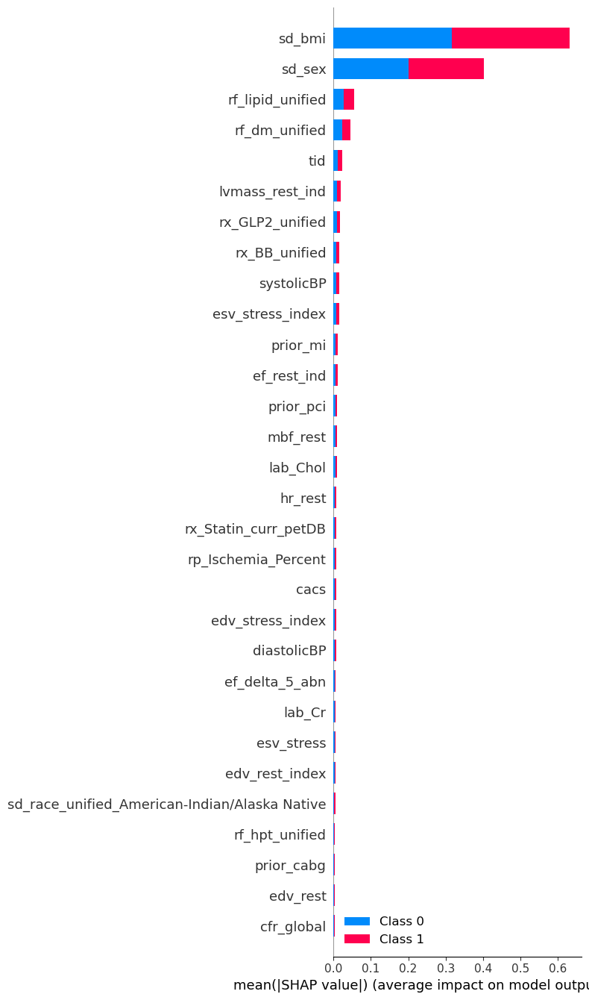

In [11]:
shap.summary_plot(shap_values_x1, df_testing_x1, plot_type="bar", max_display = 30)

#### SHAP Summary Plot

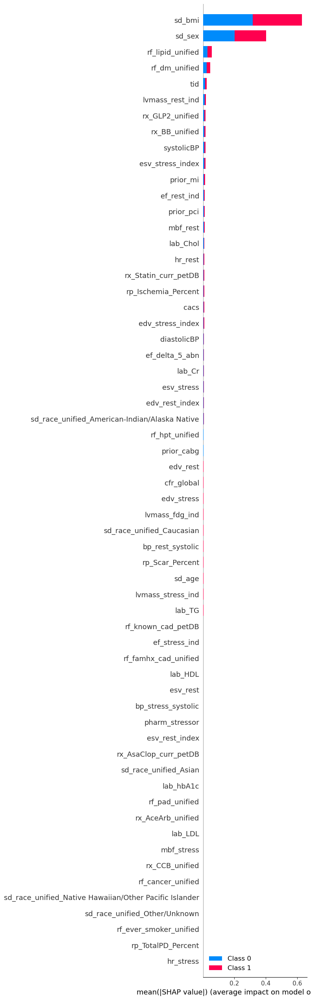

In [12]:
shap.summary_plot(shap_values_x1, df_testing_x1, max_display = 100)

### Local

In [13]:
# mace predicted as 1
np.where(results_x1 == 1)

(array([ 146,  384,  529,  576,  601,  706,  717,  741,  846,  854,  857,
         869,  890,  891,  919,  990, 1002], dtype=int64),)

In [14]:
# actual values as 1
np.where(testing_target_x1 == 1)

(array([   1,   27,   52,   76,   85,  102,  104,  117,  125,  134,  189,
         229,  322,  327,  328,  342,  351,  361,  384,  388,  389,  398,
         423,  424,  443,  460,  473,  482,  492,  509,  533,  536,  581,
         592,  599,  608,  624,  627,  642,  676,  682,  692,  694,  706,
         710,  717,  721,  741,  758,  765,  766,  779,  814,  823,  826,
         828,  846,  849,  869,  890,  891,  903,  921,  927,  931,  944,
         969,  987,  990,  993, 1002, 1040, 1064, 1076], dtype=int64),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], dtype=int64))

In [15]:
# predicting when mace = 1
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[1][1002,:], df_testing_x1.iloc[1002,:]) # using index x

In [16]:
# predicting when mace=0
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[0][2,:], df_testing_x1.iloc[2,:]) # using index x

In [17]:
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[0][:1000,:], df_testing_x1.iloc[:1000,:])

In [18]:
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[1][:1000,:], df_testing_x1.iloc[:1000,:])

### Group

In [19]:
df_results_x1 = pd.DataFrame(results_x1, columns = target.columns)
df_testing_x1 = pd.DataFrame(testing_features_x1, columns = X1.columns)

In [20]:
# combine results with features
combined = pd.concat([df_testing_x1, df_results_x1], axis=1)

In [21]:
# filter data takes in user given filters
# The expected input is a matrix where each array is a key, value pair
# Example of expected input [['sd_sex', 0],['sd_race_unified_Caucasian',1]]

def filterData(data, filters):
    filtered_data = data.copy()
    for filter_pair in filters:
        key, value = filter_pair
        filtered_data = filtered_data.loc[filtered_data[key] == value]
    
    return filtered_data
    
def getMaceArrays(data, filters):
    filtered = filterData(combined, test_filters)

    mace0 = filtered[filtered['o_mace'] == 0]
    mace0 = mace0.drop('o_mace', axis = 1)
    mace1 = filtered[filtered['o_mace'] == 1]
    mace1 = mace1.drop('o_mace', axis = 1)
    return [mace0, mace1]

def getAggregatedData(data, numeric_cols, yes_no_cols, other_cols):
    mace_median = data[numeric_cols].median()
    mace_mode = data[yes_no_cols + other_cols].mode()
    merged = pd.DataFrame(mace_median).T.merge(mace_mode)
    
    return merged

def createForcePlot(pipeline, data, title):
    shap.initjs()
    explainer = shap.TreeExplainer(pipeline['randomforestclassifier'])
    shap_values = explainer.shap_values(data.to_numpy())
    if title == 'Mace 0':
        print(title)
        display(shap.force_plot(explainer.expected_value[0], shap_values[0], data))
    elif title == 'Mace 1':
        print(title)
        display(shap.force_plot(explainer.expected_value[1], shap_values[1], data))


In [22]:
# select filters
#test_filters = [['sd_sex', 0], ['sd_race_unified_Caucasian',1]]

# 2 datasets: mace=0, mace=1
#mace0, mace1 = getMaceArrays(combined, test_filters)

In [23]:
# select filters
test_filters = [['sd_age', 66]]

# 2 datasets: mace=0, mace=1
mace0, mace1 = getMaceArrays(combined, test_filters)

In [24]:
# aggregate values for group level
mace_0_aggregated_x1 = getAggregatedData(mace0, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)
mace_1_aggregated_x1 = getAggregatedData(mace1, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)

In [25]:
# mace=0
createForcePlot(exported_pipeline_x1, mace_0_aggregated_x1, 'Mace 0')

Mace 0


In [26]:
# mace=1
createForcePlot(exported_pipeline_x1, mace_1_aggregated_x1, 'Mace 1')

Mace 1


In [27]:
from tkinter import *
from IPython.display import clear_output

window=Tk()
window.title('Group Interpretability')
window.geometry("700x300+10+10")
        
# Dropdown menu options
OPTIONS1 = X1.columns
        
columns_copy = list(X1.columns.copy())
columns_copy.insert(0, "none")
        
OPTIONS2 = columns_copy
        
#function to aggregate over the data based on the selections
def oki():
    global test_filters
    global mace0
    global mace1
    global mace_0_aggregated_x1
    global mace_1_aggregated_x1
    if clicked2.get() == "none":
        test_filters = [[clicked1.get(), float(t1.get())]]
    elif clicked3.get() == "none":
        test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())]]
    else:
        test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())], 
                        [clicked3.get(), float(t3.get())]]
                
    mace0, mace1 = getMaceArrays(combined, test_filters)
    mace_0_aggregated_x1 = getAggregatedData(mace0, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)
    mace_1_aggregated_x1 = getAggregatedData(mace1, numeric_cols_x1, yes_no_cols_x1, other_cols_x1)
    label.config( text = test_filters )
    
    #remove this line if you want to keep all the outputs
    clear_output(wait=True)
    
    shap.initjs()
    explainer = shap.TreeExplainer(exported_pipeline_x1['randomforestclassifier'])
    
    shap_values = explainer.shap_values(mace_0_aggregated_x1.to_numpy())
    print(test_filters,"MACE 0")
    display(shap.force_plot(explainer.expected_value[0], shap_values[0], mace_0_aggregated_x1))
    
    shap_values = explainer.shap_values(mace_1_aggregated_x1.to_numpy())
    print(test_filters,"MACE 1")
    display(shap.force_plot(explainer.expected_value[1], shap_values[1], mace_1_aggregated_x1))
    
# datatype of menu text
clicked1 = StringVar(window)
clicked2 = StringVar(window)
clicked3 = StringVar(window)

# initial menu text
clicked1.set(OPTIONS1[0])
clicked2.set(OPTIONS2[0])
clicked3.set(OPTIONS2[0])

# Create Dropdown menues
drop1 = OptionMenu( window , clicked1 , *OPTIONS1 )
drop1.pack()
drop1.place(x=100, y=50)
drop2 = OptionMenu( window , clicked2 , *OPTIONS2 )
drop2.pack()
drop2.place(x=100, y=100)
drop3 = OptionMenu( window , clicked3 , *OPTIONS2 )
drop3.pack()
drop3.place(x=100, y=150)
        
#Create OK button
button = Button(window, text="OK", command=oki)
button.pack()
button.place(x=150, y=200)
        
#Create exit button
exit_button = Button(window, text="Exit", command=window.destroy)
exit_button.pack(pady=20)
exit_button.place(x=500, y=200)
        
#Create label info window
label = Label( window , text = " " )
label.pack()
        
#Create entry box windows for values
t1=Entry()
t2=Entry()
t3=Entry()
t1.place(x=500, y=50)
t2.place(x=500, y=100)
t3.place(x=500, y=150)

window.mainloop()

[['sd_age', 66.0], ['sd_sex', 0.0], ['rx_AsaClop_curr_petDB', 1.0]] MACE 0


[['sd_age', 66.0], ['sd_sex', 0.0], ['rx_AsaClop_curr_petDB', 1.0]] MACE 1


## Model X2

In [28]:
# model X2

# NOTE: Make sure that the outcome column is labeled 'target' in the data file
tpot_data_x2 = pd.read_csv('X2.csv', dtype=np.float64)
target = pd.read_csv('target.csv')

training_features_x2, testing_features_x2, training_target_x2, testing_target_x2 = \
            train_test_split(tpot_data_x2, target, random_state=42)

imputer = SimpleImputer(strategy="median")
imputer.fit(training_features_x2)
training_features_x2 = imputer.transform(training_features_x2)
testing_features_x2 = imputer.transform(testing_features_x2)

# Average CV score on the training set was: 0.9126299473614102
exported_pipeline_x2 = make_pipeline(
    StackingEstimator(estimator=RandomForestClassifier(bootstrap=True, criterion="gini", max_features=0.7000000000000001, 
                                                       min_samples_leaf=8, min_samples_split=4, n_estimators=100)),
    StackingEstimator(estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=6, max_features=0.4, 
                                                           min_samples_leaf=6, min_samples_split=14, n_estimators=100, 
                                                           subsample=1.0)),
    RandomForestClassifier(bootstrap=False, criterion="gini", max_features=0.8, min_samples_leaf=16, min_samples_split=16, 
                           n_estimators=100)
)

# Fix random state for all the steps in exported pipeline
set_param_recursive(exported_pipeline_x2.steps, 'random_state', 42)

exported_pipeline_x2.fit(training_features_x2, training_target_x2)
results_x2 = exported_pipeline_x2.predict(testing_features_x2)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


In [29]:
#explainer_x2 = shap.TreeExplainer(exported_pipeline_x2['randomforestclassifier'])
#shap_values_x2 = explainer_x2.shap_values(testing_features_x2)

#pd.DataFrame(shap_values_x2[0]).head()

In [30]:
# add labels
#df_testing_x2 = pd.DataFrame(testing_features_x2, columns = X2.columns)

### Global

#### Feature Importances

#### SHAP Summary Plot

### Local

### Group